# How to Draw a Circuit

This how-to guide walks you through drawing a circuit generated by a simple Workbench program. We will cover two ways of drawing a circuit:

1. Using the built-in `draw()` method.
2. Using the interactive Circuit Designer widget.

## Step 1. (common to both methods) Write the program

Write the Workbench code following the steps outlined in [How to Write a Simple Program](./Write-Simple-Program.ipynb).
Your code will start with creating a [QPU object](../tutorials/QPU-Object.ipynb).

```python
qpu = QPU(num_qubits=4)
```

If you are specifying the [list of filters](../tutorials/Configuring-Execution.ipynb) in the constructor of the QPU, make sure to include the `'>>buffer>>'` filter in the list.

```python
qpu = QPU(num_qubits=4, filters=['>>buffer>>', '>>bit-sim>>'])
```


## Step 2a. Draw the circuit using the qpu.draw() method

Call the `draw()` method of the QPU object to draw the circuit.

```python
qpu.draw()
```

If your code uses subroutines - either built-in Workbench subroutines or Qubricks you implemented yourself - call the `draw()` method with `show_qubricks=True` argument.

```python
qpu.draw(show_qubricks=True)
```

## Step 2b. Draw the circuit using interactive Circuit Designer widget

Import the `circuit_designer` module from `psiqworkbench.integrations` subpackage and call the `draw` function, passing it the QPU instance. Please note that for this to work, Workbench has to be installed with `circuit-designer` extra.

```python
from psiqworkbench.integrations import circuit_designer

circuit_designer.draw(qpu)
```

You can click on registers and Qubricks in the diagram to collapse and expand them. You can also pass the `expanded=True`, `expanded="qubricks"` or `expanded="registers"` to control what gets expanded by default.

## Example

The following example shows how to draw a circuit generated by the Workbench program from [How to Write a Simple Program](./Write-Simple-Program.ipynb) that prepares two Bell states in two different ways (using the primitive gates and using state preparation library) and then measures them.

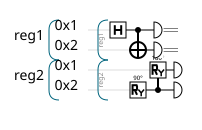

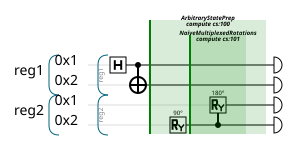

In [1]:
from psiqworkbench import QPU, Qubits
from workbench_algorithms import ArbitraryStatePrep

# Initialize a QPU
qpu = QPU(num_qubits=4)

# Allocate qubits
reg1 = Qubits(2, "reg1", qpu=qpu)
reg2 = Qubits(2, "reg2", qpu=qpu)

# Perform the computation using primitive gates
reg1[0].had()
reg1[1].x(cond=reg1[0])

# Perform the computation using library routines
state_prep = ArbitraryStatePrep([1, 0, 0, 1])
state_prep.compute(reg2)

# Get the results
res1 = reg1.read()
res2 = reg2.read()

# Draw the circuit
qpu.draw()

# Draw the circuit with Qubricks
qpu.draw(show_qubricks=True)

In [2]:
from psiqworkbench.integrations import circuit_designer

# Create Circuit Designer diagram with default setting
circuit_designer.draw(qpu)

![](./media/circuit_designer_default.svg)

In [3]:
# Create Circuit Designer diagram with both Qubricks and registers expanded
circuit_designer.draw(qpu, expanded=True)

![](./media/circuit_designer_expanded.svg)